# Project : Ecommerce Dataset
   

    
###    1. [E-commerce dataset ](https://www.kaggle.com/datasets/lissetteg/ecommerce-dataset)

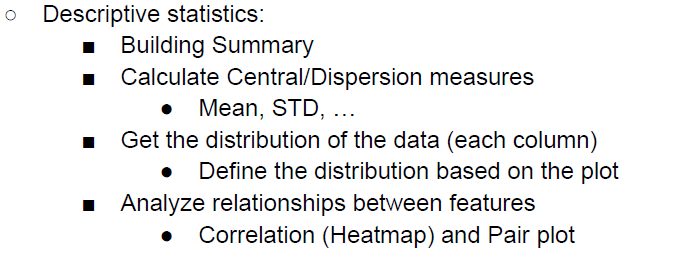

In [1]:
# Libraries

import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt

In [2]:
data = pd.read_csv('data-2.csv')
data 

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France


## Description of dataset

- InvoiceNo: The invoice number associated with the purchase.
- StockCode: A unique code for the stock or product.
- Description: The description or name of the product.
- Quantity: The quantity of the product purchased.
- InvoiceDate: The date and time when the invoice was generated.
- UnitPrice: The price per unit of the product.
- CustomerID: The ID of the customer who made the purchase.
- Country: The country where the purchase was made.

##### Number of rows: 541909 
##### Number of columns: 8 

## Building Summary

In [3]:
info = data.info()
info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [4]:
# Checking the missing values in each coulmn

missing_values = data.isnull().sum()
print(missing_values)

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64


In [5]:
selected_columns = ['Quantity', 'UnitPrice']
description = round(data[selected_columns].describe(), 2)
description

,Quantity,UnitPrice
count,541909.00,541909.00
mean,9.55,4.61
std,218.08,96.76
min,-80995.00,-11062.06
25%,1.00,1.25
50%,3.00,2.08
75%,10.00,4.13
max,80995.00,38970.00


### Using the "describe()" method for other columns such as CustomerID, Country, and so on, is not meaningful. This is why, we choose Quantity and UnitPrice column

## Calculate Central/Dispersion measures
-  Mean, STD, …

In [6]:
selected_columns = ['Quantity', 'UnitPrice']
selected_data = data[selected_columns]

In [7]:
# Mean
mean = round(selected_data.mean(), 2)
mean

Quantity     9.55
UnitPrice    4.61
dtype: float64

In [8]:
# Median
median = round(selected_data.median(), 2)
median

Quantity     3.00
UnitPrice    2.08
dtype: float64

In [9]:
# satndard deviation
std = round(selected_data.std(), 2)
std

Quantity     218.08
UnitPrice     96.76
dtype: float64

In [10]:
# Variance

variance = round(selected_data.var(), 2)
variance

Quantity     47559.39
UnitPrice     9362.47
dtype: float64

In [11]:
# Quartiles

first_qurtile = selected_data.quantile(0.25)
third_qurtile = selected_data.quantile(0.75)

# Interquartile Range
iqr = third_qurtile - first_qurtile

print("First Qurtile: ")
print(first_qurtile)
print()
print("Third Qurtile: ")
print(third_qurtile)

print()

print("Inter-quartile range: ")
print(iqr)

First Qurtile: 
Quantity     1.00
UnitPrice    1.25
Name: 0.25, dtype: float64

Third Qurtile: 
Quantity     10.00
UnitPrice     4.13
Name: 0.75, dtype: float64

Inter-quartile range: 
Quantity     9.00
UnitPrice    2.88
dtype: float64


In [12]:
# Range values
range_values = selected_data.max() - selected_data.min()
range_values

Quantity     161990.00
UnitPrice     50032.06
dtype: float64

## Get the distribution of the data (each column)
- Define the distribution based on the plot

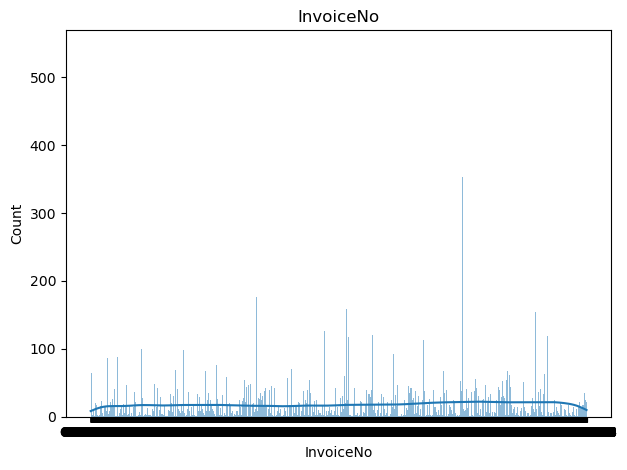

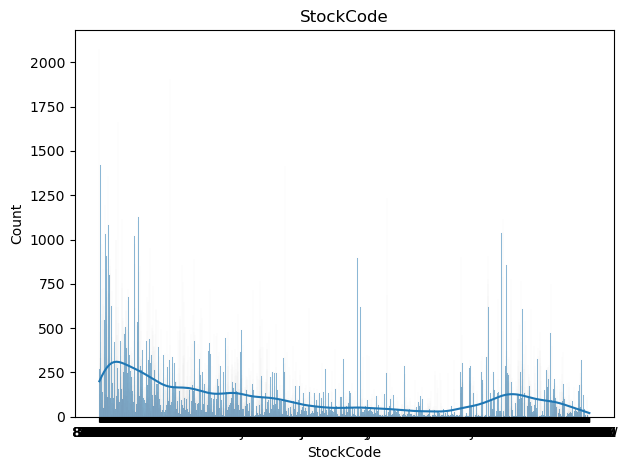

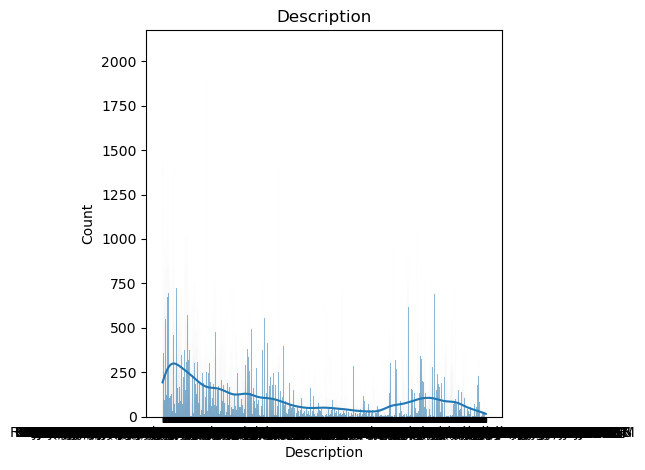

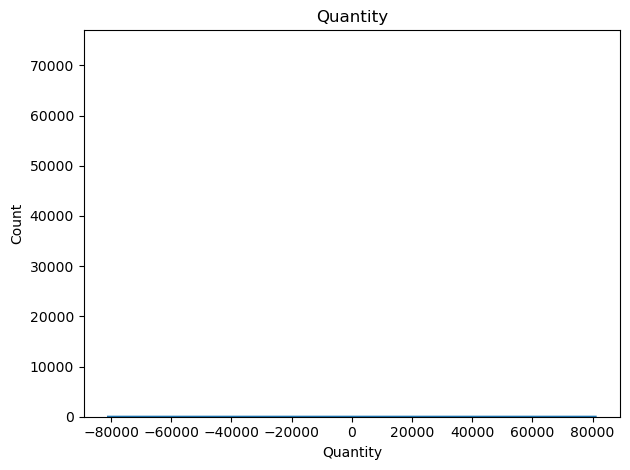

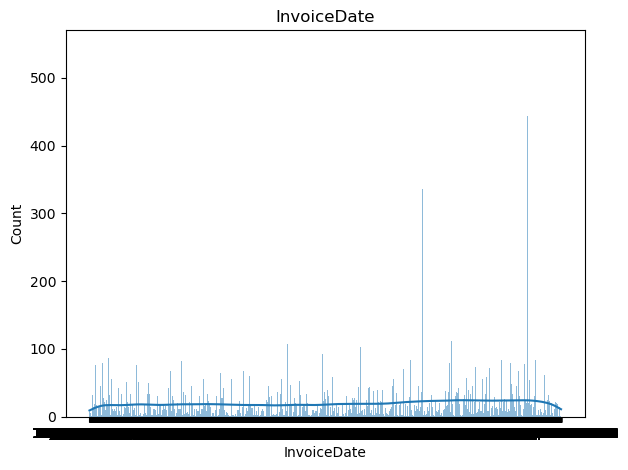

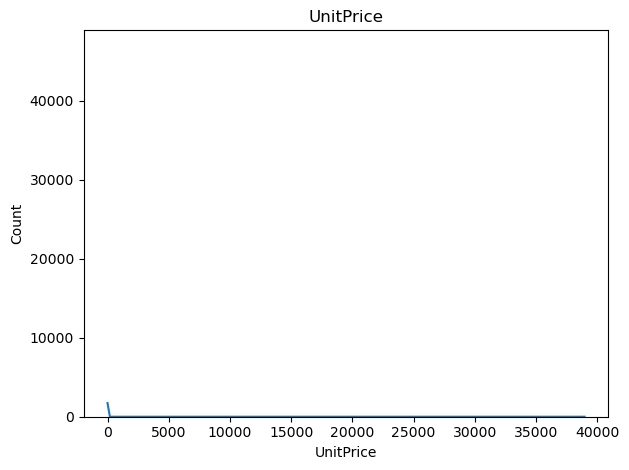

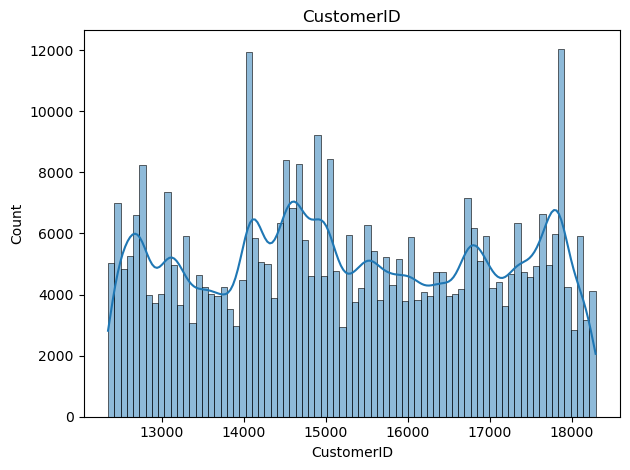

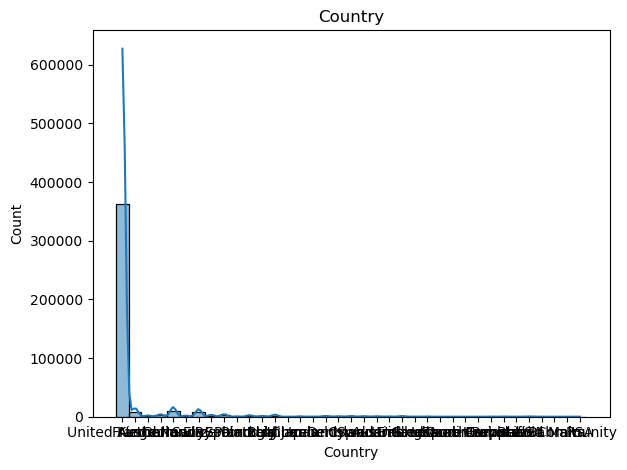

In [13]:
# Drop rows with missing values in the two columns
data_without_missing = data.dropna(subset=['Description', 'CustomerID'])

# Plot distributions for each remaining column
for column in data_without_missing.columns:
    sns.histplot(data_without_missing[column], kde=True)
    plt.title(column)
    plt.tight_layout()
    plt.show()

#### Analyze relationships between features
- Correlation (Heatmap) and Pair plot

In [15]:
corre_selected_col=round(selected_column.corr(),2)
corre_selected_col

,Quantity,UnitPrice
Quantity,1.00,0.99
UnitPrice,0.99,1.00


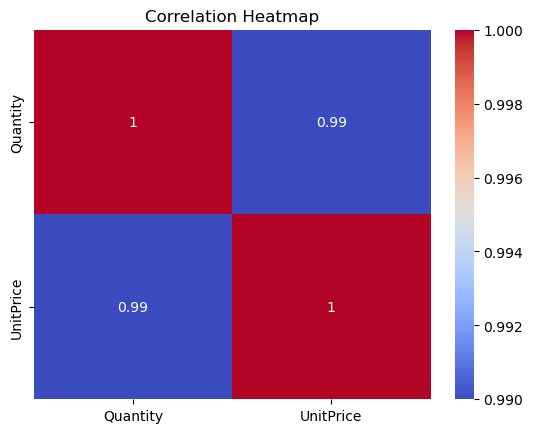

In [16]:
# Plot correlation heatmap
sns.heatmap(corre_selected_col, annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()

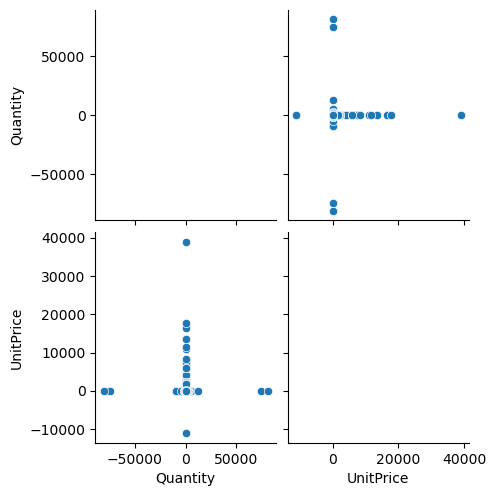

In [3]:
# Pair plot

# Selecting the numeric columns for the pair plot
numeric_columns = ['Quantity', 'UnitPrice']

# Creating the pair plot
sns.pairplot(data[numeric_columns])

plt.show()

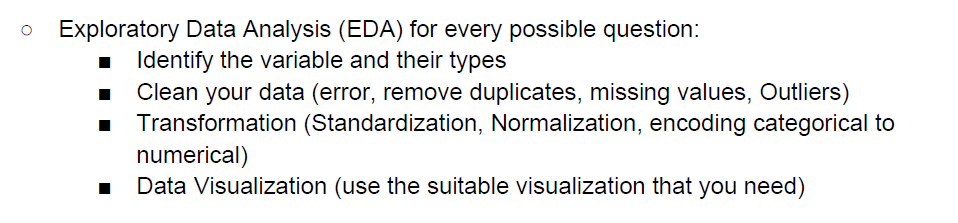

## Identify the variable and their types 

In [4]:
info = data.info()
info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


### Clean your data(error, remove duplicates, missing values, outliers)

In [5]:
has_errors = False
print("Errors in DataFrame:")
for column in data.columns:
    try:
        # Checking for missing values in the column
        if data[column].isnull().any():
            has_errors = True
            print("Error: Missing values found in column:", column)
            print(data[data[column].isnull()])

        # Checking for out-of-range errors
        errors = data[(data[column] < data[column].min()) | (data[column] > data[column].max())]
        if not errors.empty:
            has_errors = True
            print("Errors found in column:", column)
            print(errors)

    except TypeError:
        print("Error: Non-numeric values found in column:", column)
        has_errors = True

if not has_errors:
    print("No errors found in DataFrame")


Errors in DataFrame:
Error: Missing values found in column: Description
       InvoiceNo StockCode Description  Quantity      InvoiceDate  UnitPrice  \
622       536414     22139         NaN        56  12/1/2010 11:52        0.0   
1970      536545     21134         NaN         1  12/1/2010 14:32        0.0   
1971      536546     22145         NaN         1  12/1/2010 14:33        0.0   
1972      536547     37509         NaN         1  12/1/2010 14:33        0.0   
1987      536549    85226A         NaN         1  12/1/2010 14:34        0.0   
...          ...       ...         ...       ...              ...        ...   
535322    581199     84581         NaN        -2  12/7/2011 18:26        0.0   
535326    581203     23406         NaN        15  12/7/2011 18:31        0.0   
535332    581209     21620         NaN         6  12/7/2011 18:35        0.0   
536981    581234     72817         NaN        27  12/8/2011 10:33        0.0   
538554    581408     85175         NaN        20

#### Finding outliers using IQR and visualize using Boxplot

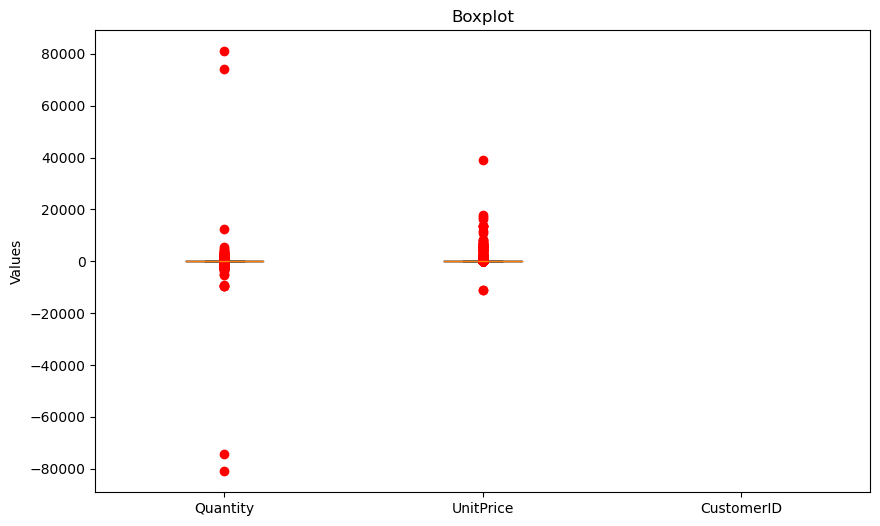

In [3]:
plt.figure(figsize=(10, 6))
numeric_columns = data.select_dtypes(include=np.number).columns
bp = plt.boxplot(data[numeric_columns].values, showfliers=False)
plt.title('Boxplot')
plt.xticks(range(1, len(numeric_columns) + 1), numeric_columns)
plt.ylabel('Values')

for j, column in enumerate(numeric_columns, 1):
    column_values = data[column].values
    q1 = np.nanpercentile(column_values, 25)
    q3 = np.nanpercentile(column_values, 75)
    iqr = q3 - q1
    outlier_threshold = 1.5 * iqr
    column_outliers = column_values[((column_values < q1 - outlier_threshold) | (column_values > q3 + outlier_threshold))]
    for outlier in column_outliers:
        plt.plot(j, outlier, 'ro', label='Outlier')

plt.show()


### Normality test for detecting outliers

In [4]:
def detect_outliers(data, threshold=1.5):
    outliers = None
    
    if pd.api.types.is_numeric_dtype(data):
        alpha = 0.05
        stat, p = stats.shapiro(data.dropna())

        if p > alpha:
            # Normal distribution, using Z-score method (Shapiro-Wilk test)
            z_scores = np.abs(stats.zscore(data))
            outliers = data[z_scores > threshold]
        else:
            # Non-normal distribution, use Tukey's method
            q1 = np.percentile(data, 25)
            q3 = np.percentile(data, 75)
            iqr = q3 - q1
            lower_bound = q1 - threshold * iqr
            upper_bound = q3 + threshold * iqr
            outliers = data[(data < lower_bound) | (data > upper_bound)]
    
    return outliers

def visualize_outliers(column_name, outliers):
    if outliers is not None:
        plt.figure(figsize=(10, 6))
        plt.boxplot(outliers.values, showfliers=False)
        plt.scatter(range(1, len(outliers)+1), outliers.values, color='red', marker='o', label='Outliers')
        plt.xlabel('Outliers of ' + column_name)
        plt.ylabel('Values')
        plt.title('Outliers - ' + column_name)
        plt.legend()
        plt.show()
        print("Total outliers in column", column_name + ":", len(outliers))
    else:
        print('No outliers detected for column:', column_name)


In [ ]:
def visualize_outliers(column_name, outliers):
    if outliers is not None:
        plt.figure(figsize=(10, 6))
        plt.boxplot(outliers.values, showfliers=False)
        plt.scatter(range(1, len(outliers)+1), outliers.values, color='red', marker='o', label='Outliers')
        plt.xlabel('Outliers of ' + column_name)
        plt.ylabel('Values')
        plt.title('Outliers - ' + column_name)
        plt.legend()
        plt.show()
        print("Total outliers in column", column_name + ":", len(outliers))
    else:
        print('No outliers detected for column:', column_name)

# Detect outliers for each column
outliers_Quantity = detect_outliers(data['Quantity'])
outliers_UnitPrice = detect_outliers(data['UnitPrice'])
outliers_CustomerID = detect_outliers(data['CustomerID'])

# Visualize outliers for each column
visualize_outliers('Quantity', outliers_Quantity)
visualize_outliers('UnitPrice', outliers_UnitPrice)
visualize_outliers('CustomerID', outliers_CustomerID)


In [5]:
# Group the data by countries and calculating the sum of unit price and quantity
grouped_data = data.groupby('Country').agg({'UnitPrice': 'sum', 'Quantity': 'sum'})

print(grouped_data)

                        UnitPrice  Quantity
Country                                    
Australia                4054.750     83653
Austria                  1701.520      4827
Bahrain                    86.570       260
Belgium                  7540.130     23152
Brazil                    142.600       356
Canada                    910.580      2763
Channel Islands          3738.550      9479
Cyprus                   3920.070      6317
Czech Republic             88.150       592
Denmark                  1266.950      8188
EIRE                    48447.190    142637
European Community        294.050       497
Finland                  3786.850     10666
France                  43031.990    110480
Germany                 37666.000    117448
Greece                    713.290      1556
Hong Kong               12241.500      4769
Iceland                   481.210      2458
Israel                   1079.040      4353
Italy                    3879.390      7999
Japan                     814.86

In [8]:
# Calculate the total cost for each customer
data['TotalCost'] = data['Quantity'] * data['UnitPrice']

# Filter the data based on the desired country
country = "United Kingdom"  
filtered_data = data[data['Country'] == country]

# Group the data by CustomerID and Description, and count the occurrences
grouped_data = filtered_data.groupby(['CustomerID', 'Description']).size().reset_index(name='Count')

# Filter the results 
filtered_grouped_data = grouped_data[grouped_data['Count'] > 1]

print(filtered_grouped_data)

        CustomerID                         Description  Count
0          12346.0      MEDIUM CERAMIC TOP STORAGE JAR      2
2          12747.0       ASSORTED COLOUR BIRD ORNAMENT      6
7          12747.0                  DOORMAT UNION FLAG      2
8          12747.0              ENAMEL BREAD BIN CREAM      2
13         12747.0     GAOLERS KEYS DECORATIVE GARDEN       4
...            ...                                 ...    ...
240152     18287.0     S/4 PINK FLOWER CANDLES IN BOWL      2
240155     18287.0  SET OF 3 WOODEN SLEIGH DECORATIONS      2
240158     18287.0  SET/4 RED MINI ROSE CANDLE IN BOWL      2
240162     18287.0     SET/6 PURPLE BUTTERFLY T-LIGHTS      2
240171     18287.0       SWISS CHALET TREE DECORATION       2

[60892 rows x 3 columns]


In [9]:
# the total cost for each customer
data['TotalCost'] = data['Quantity'] * data['UnitPrice']

#data['TotalCost']: This calculates the total cost of each transaction for each customer.

# the average affordability for each country
average_affordability_by_country = data.groupby('Country')['TotalCost'].sum().mean()

# the total number of countries
total_countries = len(data['Country'].unique())

print('Total number of countries:', total_countries)
print()

# the average affordability for each country
country_average_affordability = round(data.groupby('Country')['TotalCost'].mean(), 2)

print('Average affordability by countries:')
print(country_average_affordability)

Total number of countries: 38

Average affordability by countries:
Country
Australia               108.88
Austria                  25.32
Bahrain                  28.86
Belgium                  19.77
Brazil                   35.74
Canada                   24.28
Channel Islands          26.50
Cyprus                   20.81
Czech Republic           23.59
Denmark                  48.25
EIRE                     32.12
European Community       21.18
Finland                  32.12
France                   23.07
Germany                  23.35
Greece                   32.26
Hong Kong                35.13
Iceland                  23.68
Israel                   26.63
Italy                    21.03
Japan                    98.72
Lebanon                  37.64
Lithuania                47.46
Malta                    19.73
Netherlands             120.06
Norway                   32.38
Poland                   21.15
Portugal                 19.33
RSA                      17.28
Saudi Arabia             1

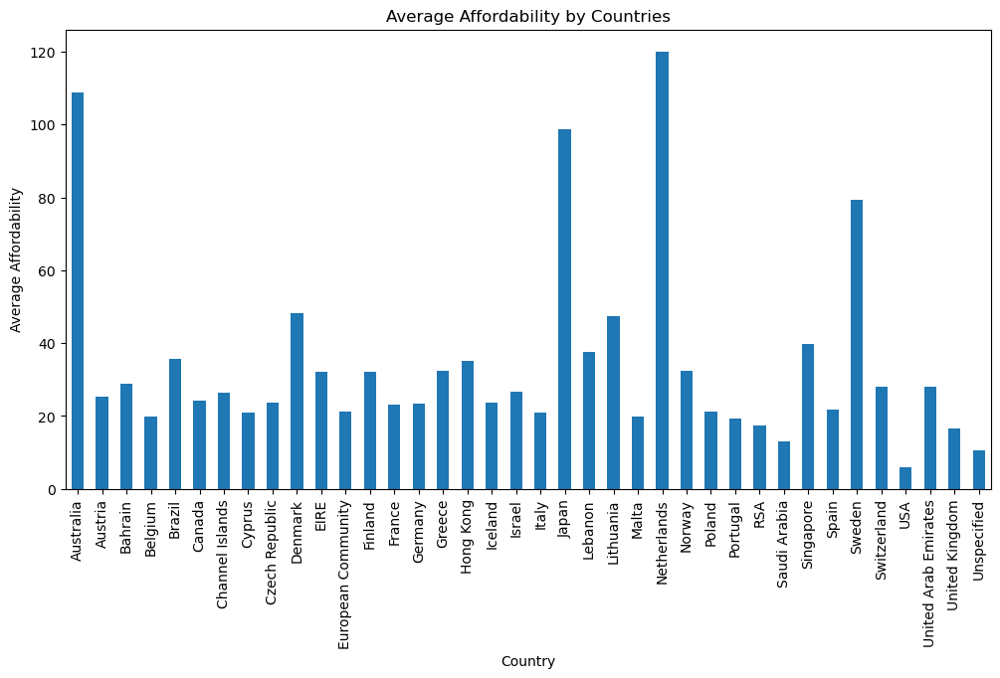

In [4]:
import matplotlib.pyplot as plt

# the total cost for each customer
data['TotalCost'] = data['Quantity'] * data['UnitPrice']

# the average affordability for each country
country_average_affordability = data.groupby('Country')['TotalCost'].mean()

# the average affordability by countries
plt.figure(figsize=(12, 6))
country_average_affordability.plot(kind='bar')
plt.xlabel('Country')
plt.ylabel('Average Affordability')
plt.title('Average Affordability by Countries')
plt.xticks(rotation=90)
plt.show()

In [5]:
import folium
from geopy.geocoders import Nominatim
from folium.plugins import MarkerCluster

grouped_data = data.groupby('Country').agg({'UnitPrice': 'sum', 'Quantity': 'sum'})

# Create a map centered on a specific location
map_center = [0, 0]  # Adjust the coordinates as per your preference
m = folium.Map(location=map_center, zoom_start=2)

# Create a MarkerCluster layer for the markers
marker_cluster = MarkerCluster().add_to(m)

# Create a geocoder object
geolocator = Nominatim(user_agent="my-app")

# Iterate over the grouped data and add markers for each country
for country, row in grouped_data.iterrows():
    # Get the aggregated unit price and quantity
    unit_price = row['UnitPrice']
    quantity = row['Quantity']
    
    # Get the latitude and longitude coordinates for the country
    location = geolocator.geocode(country)
    if location:
        latitude = location.latitude
        longitude = location.longitude
        
        # Get the average affordability for the country
        average_affordability = country_average_affordability[country]
        
        # Create a marker for the country with popup displaying the aggregated data and average affordability
        popup_text = f"Country: {country}<br>Unit Price: {unit_price}<br>Quantity: {quantity}<br>Average Affordability: {average_affordability}"
        marker = folium.Marker(location=[latitude, longitude], popup=popup_text)
        marker.add_to(marker_cluster)

# Display the map
m

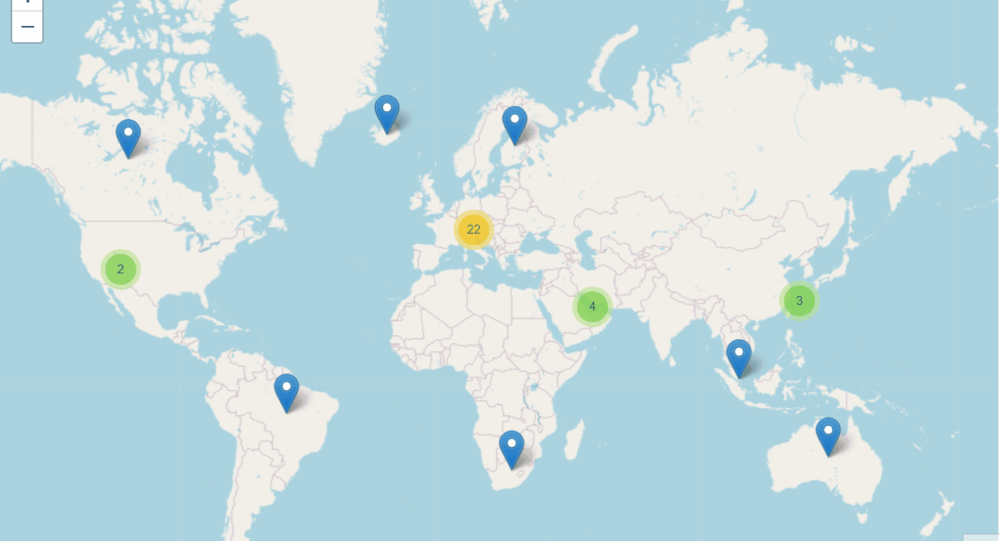

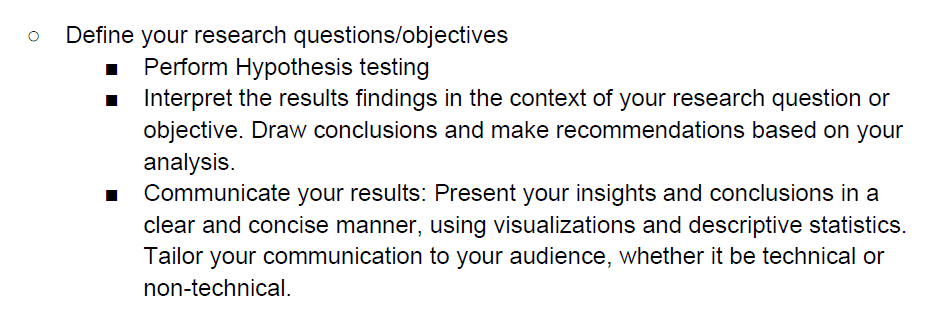

### Formulate the Hypotheses: Based on the research question, formulate the null and alternative hypotheses. For example:

- Null Hypothesis (H0): There is a significant difference in the average unit price between countries.
- Alternative Hypothesis (H1): There is no significant difference in the average unit price between countries.

In [12]:
# Filter the data 
filtered_data = data[['Country', 'UnitPrice']].dropna()

# One way ANOVA
f_statistic, p_value = stats.f_oneway(*[group['UnitPrice'] for name, group in filtered_data.groupby('Country')])
#  used to compare the average unit prices between different countries.

alpha = 0.05

f_statistic = round(f_statistic, 2)

# Print the results
print(f'F-Statistic: {f_statistic}')
print(f'P-value: {p_value}')

if p_value < alpha:
    print('Reject the null hypothesis. There is a significant difference in the average unit price between countries.')
else:
    print('Fail to reject the null hypothesis. There is no significant difference in the average unit price between countries.')

F-Statistic: 8.71
P-value: 3.5817635058736703e-47
Reject the null hypothesis. There is a significant difference in the average unit price between countries.


Based on the analysis using ANOVA, the obtained F-statistic is 8.7075 and the corresponding p-value is 3.5818e-47. With a very small p-value, below the chosen significance level of 0.05, we reject the null hypothesis. This indicates that there is a significant difference in the average unit price between countries.

The result suggests that the average unit price varies significantly across different countries. 

Based on these findings, I recommend further investigation into the underlying factors that drive the disparities in average unit prices between countries. This could involve examining specific product categories, and conducting a more comprehensive analysis.

Furthermore, we can predict for other countries based on average price.To predict average prices for other countries based on the existing data, we can use statistical modeling techniques such as linear regression.

On the other hand, market basket analysis can be performed using the Apriori algorithm to discover associations or relationships among items frequently purchased or used together. For example, if a customer buys product A, they are likely to also buy product B.

Recommender systems utilize knowledge of frequently co-purchased products to make personalized recommendations to customers, enabling targeted suggestions based on their current selection (e.g., recommending product P to a customer who added products A and F to their basket).Main idea to the use of recommender systems to provide personalized recommendations based on co-purchased products.